In [2]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


# Aerosol related variables

In [3]:
ds_a = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enarlproffex1thorC1/enarlproffex1thorC1.c0.201702*.custom.nc')

# Feature_Mask

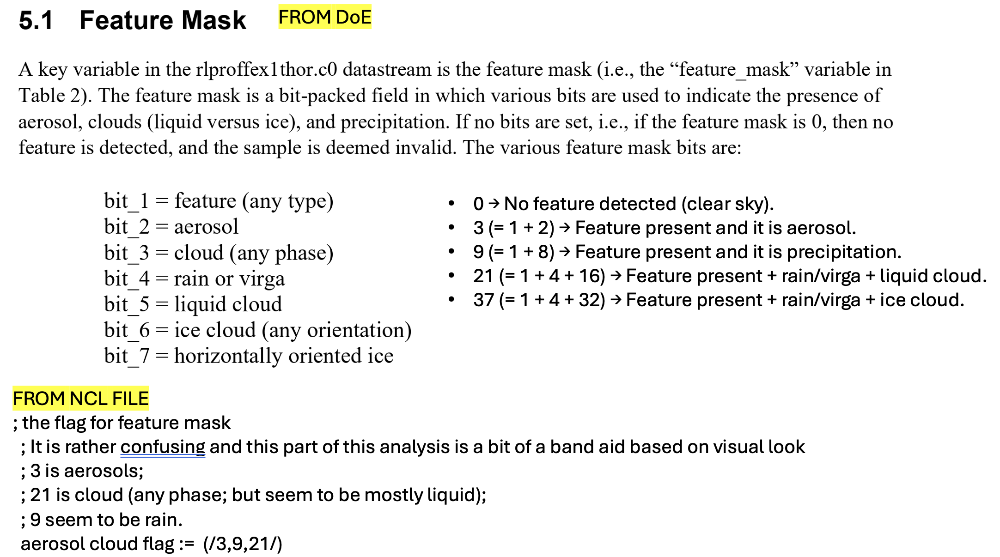

### feature_mask configration

In [3]:
# ====== 配置 ======
var_name = "feature_mask"
hcoord   = "height_high"
month    = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

# ====== helper ======
def edges_from_centers(x):
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return np.array([0, 1], dtype=float)
    if x.size == 1:
        dx = 0.5
        return np.array([x[0] - dx, x[0] + dx], dtype=float)
    dx = np.diff(x)
    return np.concatenate(([x[0] - dx[0]/2], (x[:-1] + x[1:]) / 2, [x[-1] + dx[-1]/2]))

# ====== 选取数据 ======
ds_mon = ds_a.sel({hcoord: slice(hmin_km, hmax_km)}).sel(
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)

# 只保留 0/3/9/21，其他设为 NaN
allowed = np.array([0, 3, 9, 21], dtype=float)
da_raw  = ds_mon[var_name]
da      = da_raw.where(np.isin(da_raw, allowed))

# ====== colormap / norm ======
classes = allowed
bounds  = np.array([-1.5, 1.5, 6.0, 15.0, 27.0])  # 分界，>27 走到 over
cmap    = ListedColormap(['#FFFFFF', '#7F0400', '#EFFF10', '#0F008F'])
cmap.set_over((0, 0, 0, 0))  # 超界透明
norm    = BoundaryNorm(bounds, ncolors=cmap.N, clip=False)

# ====== 时间维度 ======
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

### feature_mask plot

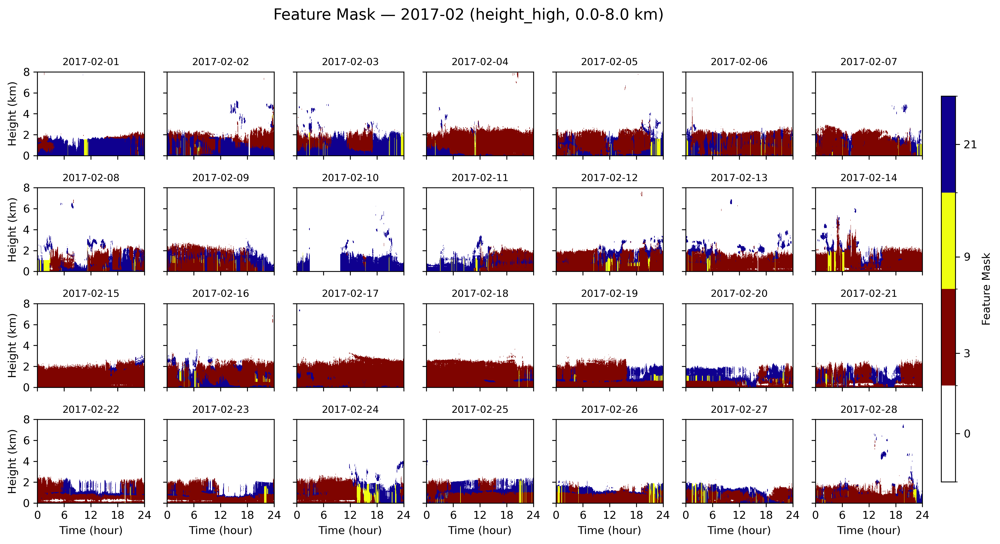

In [4]:
# ====== 绘图 ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

last_img = None
for i, day in enumerate(days):
    ax = axes[i]
    da_day = da.sel(time=slice(str(day.date()), f"{day.date()}T23:59:59"))

    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    # X: 时间 (小时)
    t_idx  = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours  = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = edges_from_centers(hours)

    # Y: 高度 (km)
    zvals   = da_day.coords[hcoord].values
    y_edges = edges_from_centers(zvals)

    # Z: (height, time)
    Z = da_day.transpose("time", hcoord).values.T

    img = ax.pcolormesh(x_edges, y_edges, Z,
                        cmap=cmap, norm=norm,
                        shading='auto', rasterized=True)
    last_img = img

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
    ax.set_xticks(np.arange(0, 25, 6))
    ax.set_yticks(np.arange(int(hmin_km), int(hmax_km) + 1, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    if i // 7 == 3:
        ax.set_xlabel("Time (hour)")

# colorbar
if last_img is not None:
    cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
    cbar = fig.colorbar(last_img, cax=cax, ticks=classes,)
    cbar.set_label("Feature Mask")
    cbar.ax.tick_params(length=4, width=0.8)

fig.suptitle(f"Feature Mask — {month} (height_high, {hmin_km}-{hmax_km} km)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


# Dust Fraction / Dust and Non-Dust Extinction / AOD / Dust AOD

Varible for calculate Dust Fraction:
- feature_mask
- depolarization_ratio
- extinction_be
- scattering_ratio_e

In [5]:
# =====month and height=======
month = "2017-02"
hmin_km, hmax_km = 0.03, 8.0

ds_mon = ds_a.sel(
    height_high=slice(hmin_km, hmax_km),
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)

# parameter
valid_classes = [3, 9, 21]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

# ====================== QC ======================
mask_qc = (ds_mon["detection_confidence_score_total"] > 0.3) & (ds_mon["qc_profile"] == 0)

feature_mask = ds_mon["feature_mask"].where(mask_qc)
pdr_meas     = ds_mon["depolarization_ratio"].where(mask_qc)
ext          = ds_mon["extinction_be"].where(mask_qc)
sca          = ds_mon["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_mon["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  


# ====================== height limitation > 30 m ======================
mask_height = (ds_mon["height_high"] >= hmin_km) & (ds_mon["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)



# —— 前面你的 QC + 类别筛选都保持不变 ——
# feature_mask, pdr_meas, ext, sca, temp_qc 此时仅做了 mask_qc 和 mask_class

# 先保存一份“用于云计算”的基准副本（不带 ±5min 排云）
feature_mask_all = feature_mask.copy()
temp_all         = temp_qc.copy()
ext_all          = ext.copy()   # 用于计算云的 COD

# ========= 仅用于“气溶胶”的 ±5 分钟排云 =========
CLOUD_CODES = [21]  # 如需液态+冰云一起排，改为 [21, 37]
is_cloud_time = feature_mask_all.isin(CLOUD_CODES).any(dim="height_high")
cloud_times   = ds_mon["time"].where(is_cloud_time).dropna("time")

t_all   = ds_mon["time"].values
t_cloud = cloud_times.values
if t_cloud.size > 0:
    idx      = np.searchsorted(t_cloud, t_all)
    idx_prev = np.clip(idx - 1, 0, t_cloud.size - 1)
    idx_next = np.clip(idx,       0, t_cloud.size - 1)
    dt_prev  = np.abs(t_all - t_cloud[idx_prev])
    dt_next  = np.abs(t_all - t_cloud[idx_next])
    min_dt   = np.minimum(dt_prev, dt_next)
    close_to_cloud = xr.DataArray(
        (min_dt <= np.timedelta64(5, 'm')),
        coords={"time": ds_mon["time"]}, dims=["time"]
    )
else:
    close_to_cloud = xr.DataArray(
        np.zeros(ds_mon.sizes["time"], dtype=bool),
        coords={"time": ds_mon["time"]}, dims=["time"]
    )

time_far_from_cloud = ~close_to_cloud

# —— 注意：只把这个时间掩膜应用到“气溶胶通道变量”的副本上 ——
feature_mask_aero = feature_mask.where(time_far_from_cloud)
pdr_meas_aero     = pdr_meas.where(time_far_from_cloud)
ext_aero          = ext.where(time_far_from_cloud)
sca_aero          = sca.where(time_far_from_cloud)
temp_aero         = temp_qc.where(time_far_from_cloud)  # 若后续需要

# ===== 后续分轨 =====
# 1) 气溶胶路径：基于 *_aero 做 aerosol_mask、PDR、dust_frac、ext_dust、AOD 等
aerosol_mask = (feature_mask_aero == 3)
pdr_meas_aerosol = pdr_meas_aero.where(aerosol_mask)
sca_aerosol      = sca_aero.where(aerosol_mask)
ext_aerosol      = ext_aero.where(aerosol_mask)
# ...（你的 PDR、dust_frac、ext_dust / ext_nondust、AOD 计算照旧，用 *_aerosol / *_aero）

# 2) 云路径：**不要**用 time_far_from_cloud，直接用 *_all 来找云并算 COD
cloud_mask_warm = (feature_mask_all == 21) & (temp_all >= T_K_WARM)
ext_cloud = ext_all.where(cloud_mask_warm).where(lambda v: v > 0)

# 下面再做你的 dz、AOD/COD 积分，其中：
# - AOD / dust_AOD / nondust_AOD 用 ext_aerosol / ext_dust / ext_nondust
# - COD 用 ext_cloud





# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)                  

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol).where(lambda v: v > 0)      
ext_nondust = ((1 - dust_frac) * ext_aerosol).where(lambda v: v > 0)

# ====================== column AOD / COD ======================

ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_mon["height_high"] * 1000.0   # m
else:
    z_int = ds_mon["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_mon["height_high"]}).broadcast_like(ext)

ext_aero = ext.where(aerosol_mask)
AOD         = (ext_aero.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")



### Dust fraction plot
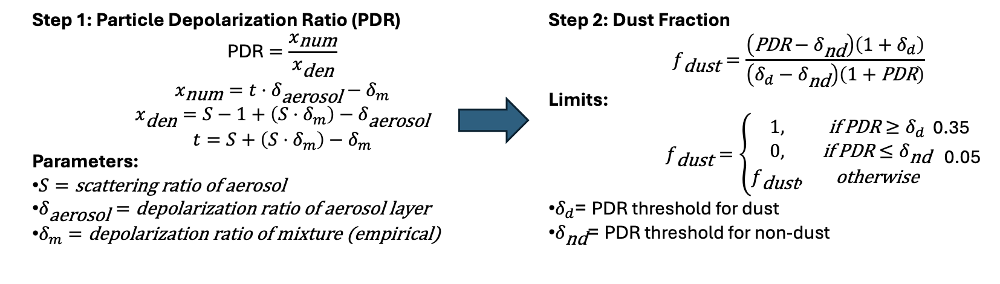

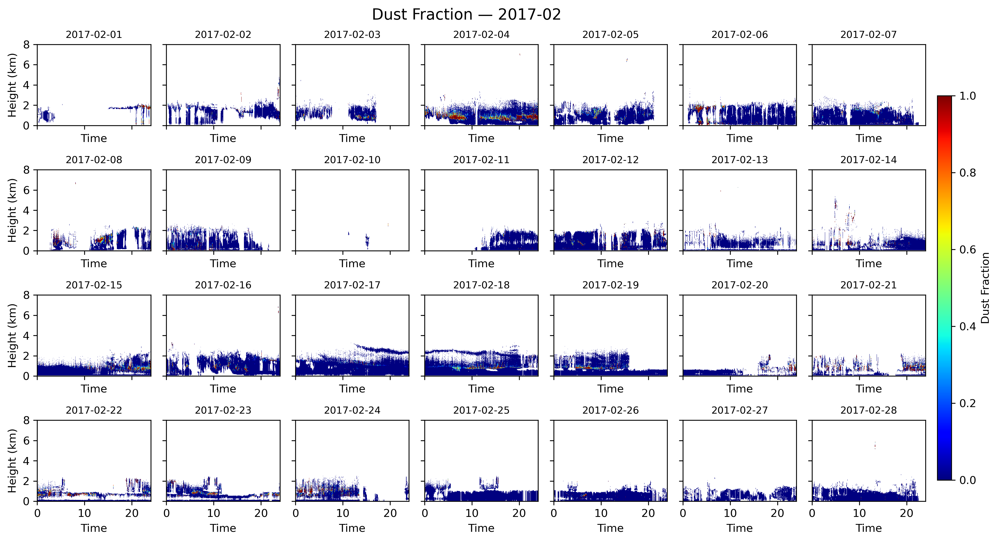

In [6]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = dust_frac[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = dust_frac.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet", vmin=0, vmax=1, shading="auto")  # 连续色条
    ax.set_title(day.strftime("%m-%d"), fontsize=8)
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax)
cbar.set_label("Dust Fraction")
plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Fraction — {month}", fontsize=14)
plt.show()


#### Linear depolarization ratio

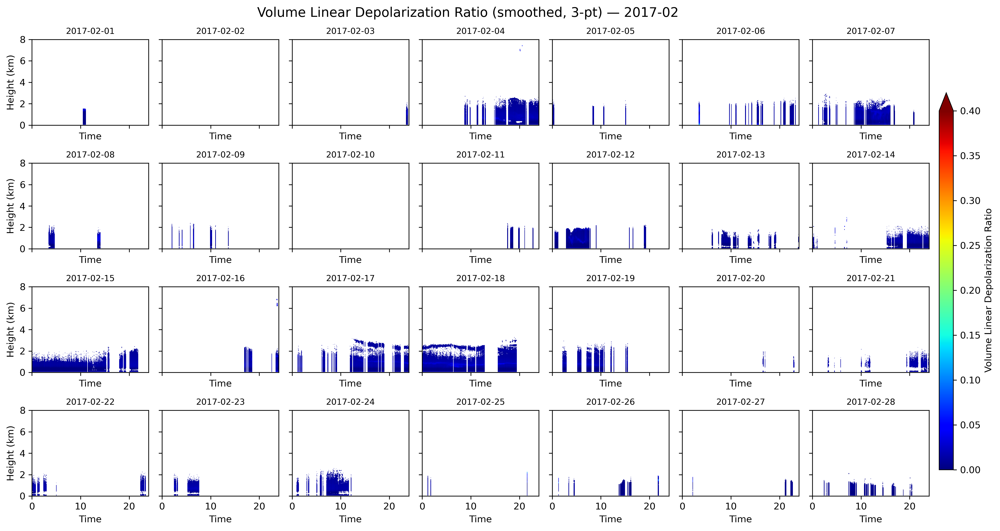

In [7]:
vldr = ds_mon["depolarization_ratio"].where(mask_qc).where(mask_height).where(time_far_from_cloud)
vldr = vldr.where(mask_class)
vldr_s = vldr.rolling(time=3, center=True, min_periods=1).mean()

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = vldr_s[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges,
                          [height[-1] + (height[-1]-height[-2])/2]))

vmax_vldr = np.nanpercentile(vldr_s.values, 99)
if not np.isfinite(vmax_vldr) or vmax_vldr <= 0:
    vmax_vldr = 0.4
vmin_vldr = 0.0

fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = vldr_s.sel(time=slice(str(t0), str(t1)))
    if da_day.time.size < 2:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges,
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="jet",
                        shading="auto", vmin=0, vmax=0.4)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# colorbar
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Volume Linear Depolarization Ratio")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Volume Linear Depolarization Ratio (smoothed, 3-pt) — {month}", fontsize=14)
plt.show()

### Total extinction, Dust and non-Dust extinction
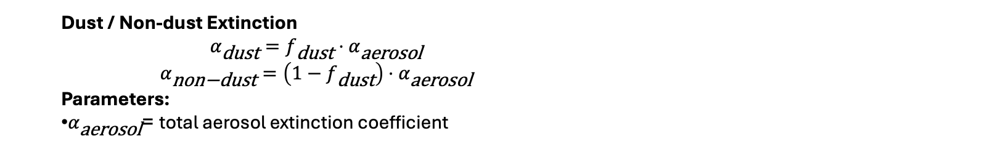

#### Total Extinction

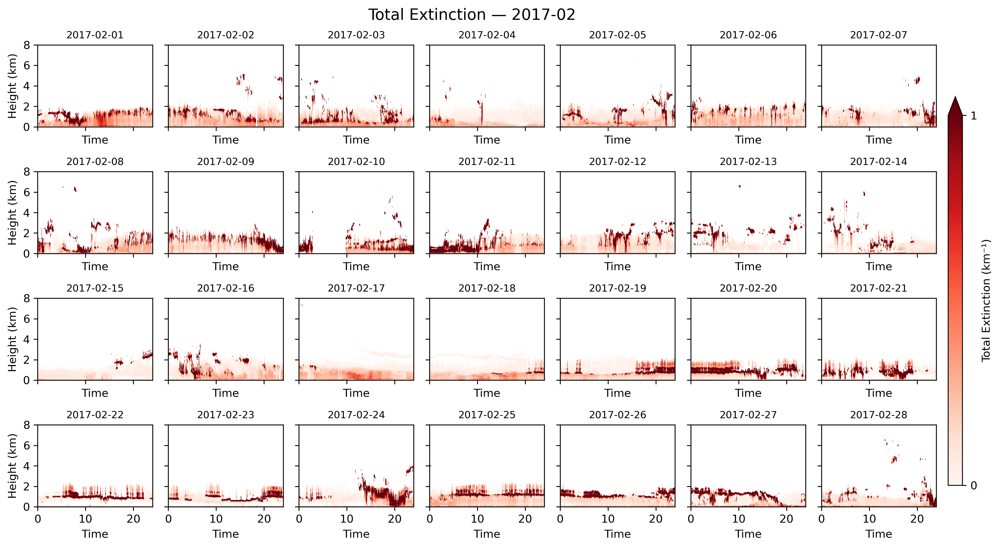

In [8]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext[hcoord].values  # 使用总 extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    # 绘制总 extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Reds", shading="auto",
        vmin=0, vmax=1  # 
    )
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 1,])
cbar.set_label("Total Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Total Extinction — {month}", fontsize=14)
plt.show()



#### Dust Extinction

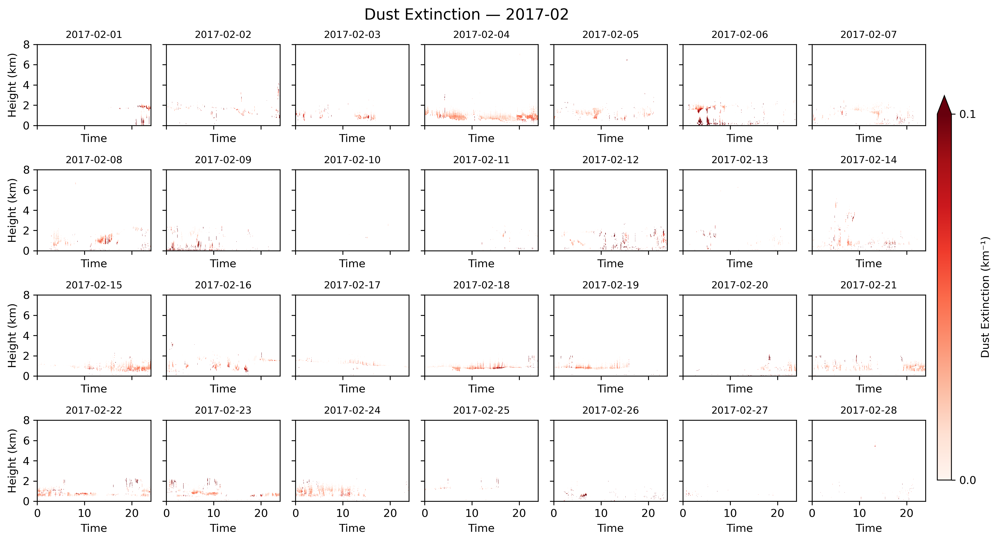

In [9]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_dust[hcoord].values  # 使用 dust extinction
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_dust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    # 横轴小时
    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))


    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.1)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1,])
cbar.set_label("Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust Extinction — {month}", fontsize=14)
plt.show()


#### Non-Dust Extinction

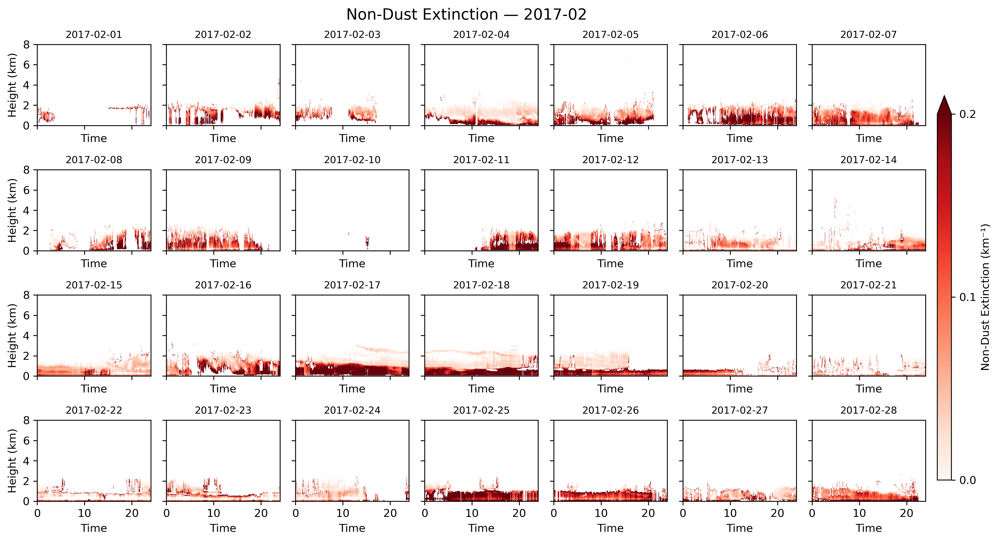

In [10]:
# ====== patameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_nondust[hcoord].values  
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate(([height[0] - (height[1]-height[0])/2], z_edges, 
                          [height[-1] + (height[-1]-height[-2])/2]))

# ====== PLot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    da_day = ext_nondust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue


    t = pd.to_datetime(da_day.time.values)
    t_idx = pd.DatetimeIndex(t)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate(([hours[0] - (hours[1]-hours[0])/2], x_edges, 
                              [hours[-1] + (hours[-1]-hours[-2])/2]))

    # non-dust extinction
    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(x_edges, z_edges, Z, cmap="Reds", shading="auto", vmin=0, vmax=0.2)  # 连续色条
    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])  
cbar = fig.colorbar(img, cax=cax, extend='max')


cbar.set_ticks([0, 0.1, 0.2,])
cbar.set_label("Non-Dust Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Non-Dust Extinction — {month}", fontsize=14)
plt.show()


### AOD and Dust AOD
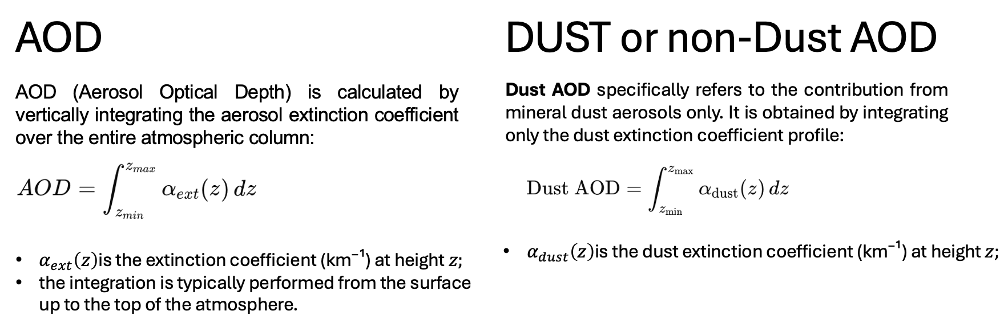

#### AOD

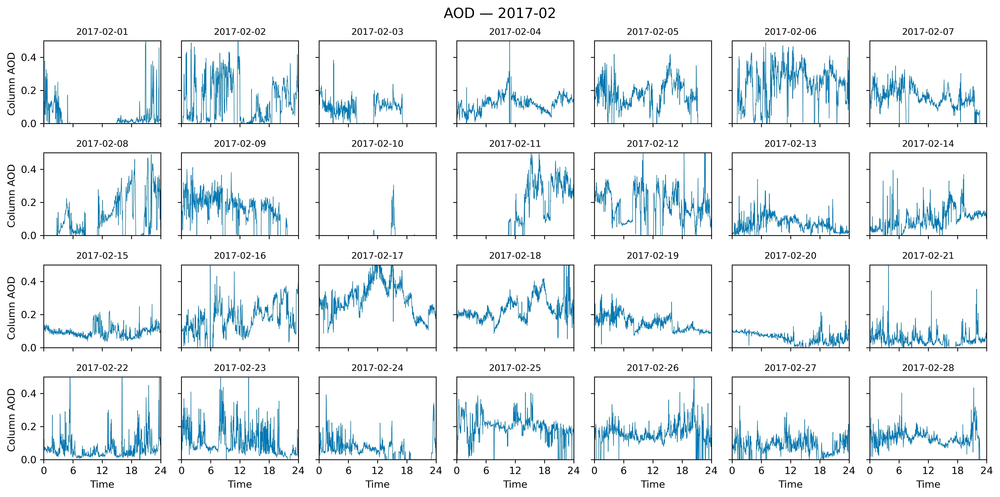

In [11]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)

    ax.set_ylim(0, 0.5)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"AOD — {month}", fontsize=14)
plt.show()


#### Dust AOD

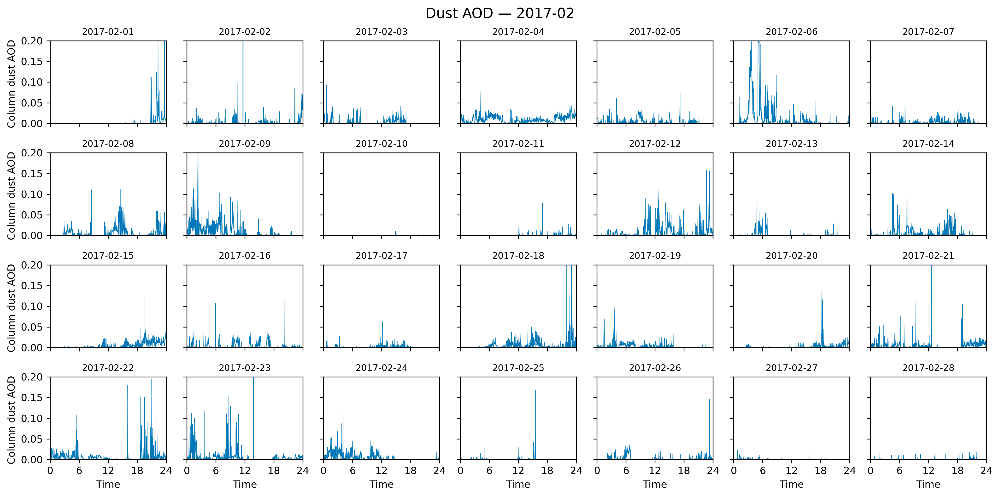

In [12]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = dust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 0.2)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Dust AOD — {month}", fontsize=14)
plt.show()

#### non-Dust AOD

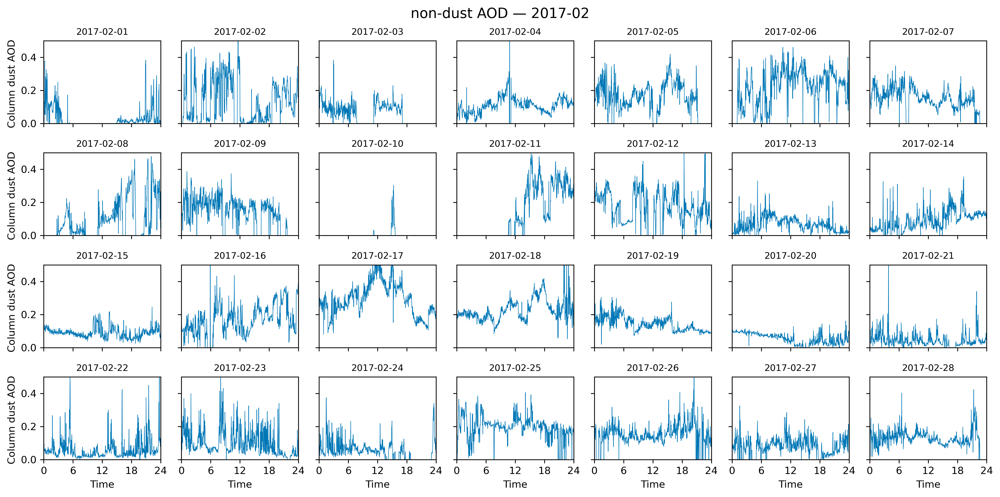

In [13]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = nondust_AOD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 0.5)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Column dust AOD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"non-dust AOD — {month}", fontsize=14)
plt.show()

# Cloud related variables

In [14]:
ds_c = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/enamwrret2turnC1/enamwrret2turnC1.c1.201702*.nc')

In [15]:
month = "2017-02"
ds_mon = ds_c.sel(time=slice(f"{month}-01", f"{month}-28T23:59:59"))

#### Liquid Water Path

In [16]:
lwp = ds_mon["phys_lwp"]        
qc  = ds_mon["qc_phys_lwp"]   

lwp_qc = lwp.where(qc == 0)
lwp_s = lwp_qc.rolling(time=3, center=True, min_periods=1).mean()

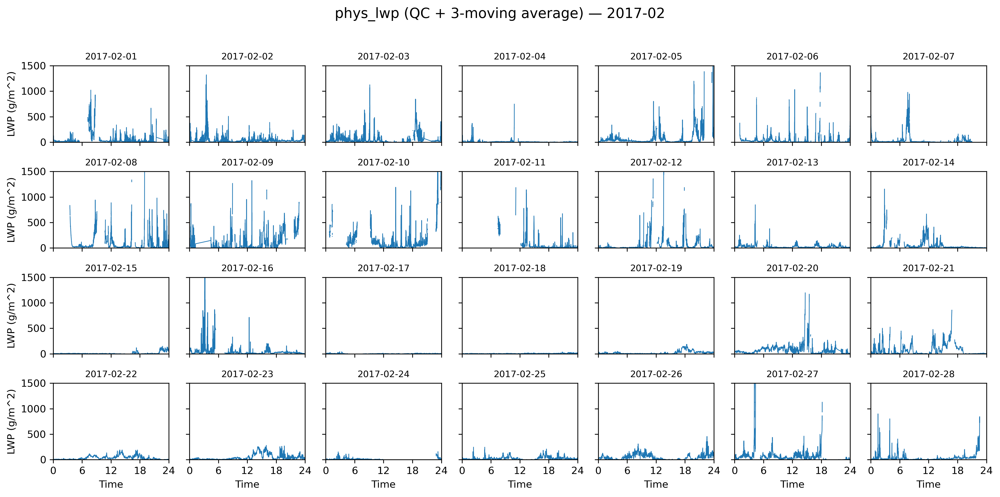

In [17]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    t0 = pd.Timestamp(day)
    t1 = t0 + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    lwp_day = lwp_s.sel(time=slice(str(t0), str(t1)))

    if lwp_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx = pd.DatetimeIndex(lwp_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, lwp_day.values, lw=0.7)

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 1500)
    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel(f"LWP ({lwp_s.attrs.get('units','')})")
    if i // 7 == 3:
        ax.set_xlabel("Time")

fig.suptitle(f"phys_lwp (QC + 3-moving average) — {month}", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

#### Cloud Extinction

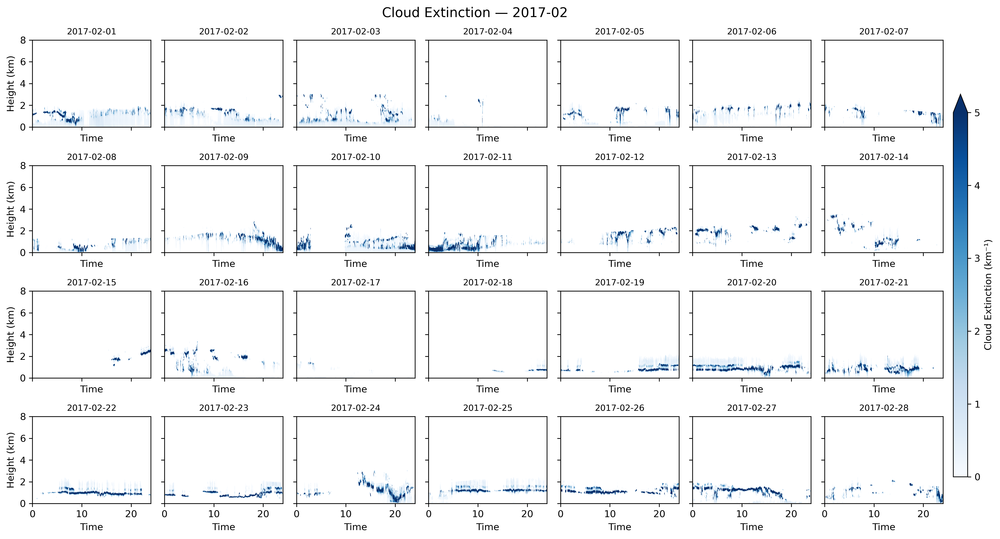

In [18]:
# ====== parameter ======
hcoord = "height_high"
month = "2017-02"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

height = ext_cloud[hcoord].values
z_edges = (height[:-1] + height[1:]) / 2
z_edges = np.concatenate((
    [height[0] - (height[1]-height[0])/2],
    z_edges,
    [height[-1] + (height[-1]-height[-2])/2]
))

vmax_cloud = np.nanpercentile(ext_cloud.values, 99)
if not np.isfinite(vmax_cloud) or vmax_cloud <= 0:
    vmax_cloud = 1.0  
vmin_cloud = 0.0

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 8), sharey=True, sharex=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]
    day_start = pd.Timestamp(day)
    day_end   = day_start + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)

    da_day = ext_cloud.sel(time=slice(str(day_start), str(day_end)))

    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    t_idx  = pd.DatetimeIndex(pd.to_datetime(da_day.time.values))
    hours  = (t_idx - t_idx.normalize()).total_seconds() / 3600.0
    if hours.size < 2:
        ax.set_visible(False)
        continue
    x_edges = (hours[:-1] + hours[1:]) / 2
    x_edges = np.concatenate((
        [hours[0] - (hours[1]-hours[0])/2],
        x_edges,
        [hours[-1] + (hours[-1]-hours[-2])/2]
    ))

    Z = da_day.transpose("time", hcoord).values.T
    img = ax.pcolormesh(
        x_edges, z_edges, Z,
        cmap="Blues", shading="auto",
        vmin=0, vmax=5)

    ax.set_xlim(0, 24)
    ax.set_ylim(hmin_km, hmax_km)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    ax.set_xlabel("Time")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

# ====== colorbar ======
fig.subplots_adjust(right=0.88)
cax = fig.add_axes([1.0, 0.12, 0.015, 0.7])
cbar = fig.colorbar(img, cax=cax, extend='max')
cbar.set_label("Cloud Extinction (km⁻¹)")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"Cloud Extinction — {month}", fontsize=14)
plt.show()


#### COD

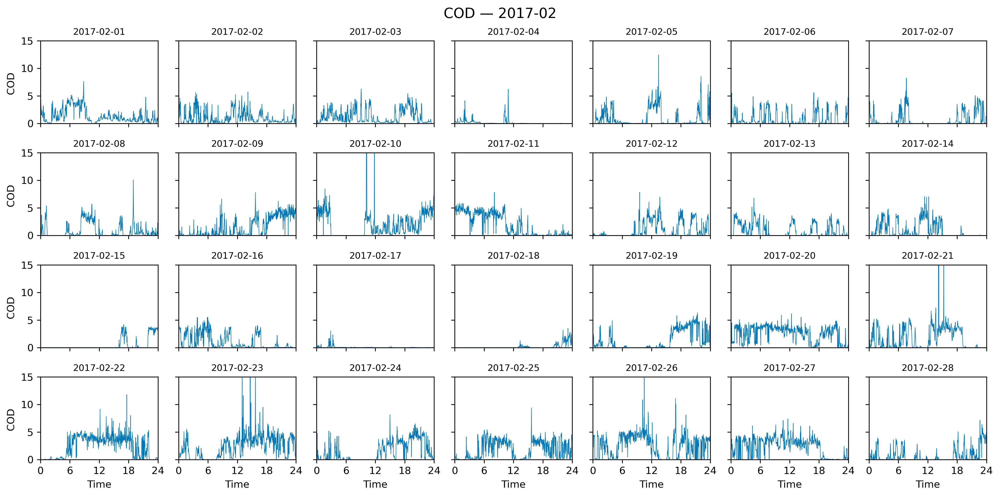

In [19]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(14, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    t0, t1 = pd.Timestamp(day), pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    aod_day = COD.sel(time=slice(str(t0), str(t1)))

    if aod_day.time.size == 0:
        ax.set_visible(False)
        continue

    # hourly time series
    t_idx = pd.DatetimeIndex(aod_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    ax.plot(hours, aod_day.values, lw=0.5, color="#0077b6")

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 15)

    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("COD ")
    if i // 7 == 3:
        ax.set_xlabel("Time")

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig.suptitle(f"COD — {month}", fontsize=14)
plt.show()

#### Dust Vertical Distribution

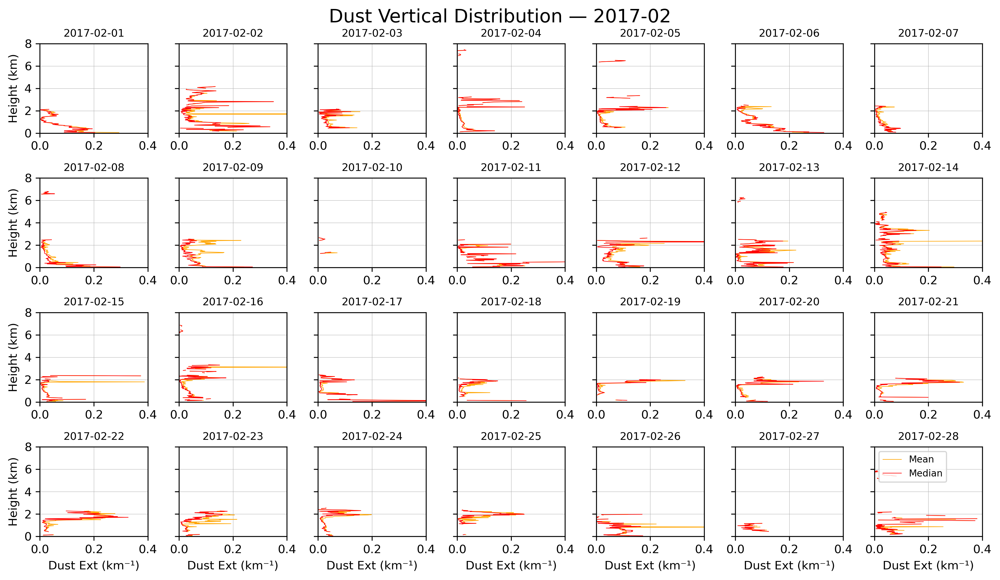

In [20]:
# ====== parameters ======
month = "2017-02"
hcoord = "height_high"
hmin_km, hmax_km = 0.0, 8.0

days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")
height = ext_dust[hcoord].values  

# ====== plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    da_day = ext_dust.sel(time=slice(str(day), str(day + pd.Timedelta(days=1) - pd.Timedelta(seconds=1))))
    
    if da_day.time.size == 0:
        ax.set_visible(False)
        continue

    dust_mean = da_day.mean(dim="time", skipna=True).values
    dust_median = da_day.median(dim="time", skipna=True).values


    ax.plot(dust_mean, height, color="orange", label="Mean", lw=0.5)
    ax.plot(dust_median, height, color="red", label="Median", lw=0.5)

    ax.set_xlim(0, 0.4)
    ax.set_ylim(0, 8)
    ax.set_yticks(np.arange(0, 9, 2))
    if i % 7 == 0:
        ax.set_ylabel("Height (km)")
    if i // 7 == 3:
        ax.set_xlabel("Dust Ext (km⁻¹)")
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)
    ax.grid(True, lw=0.3)

axes[-1].legend(loc="upper left", fontsize=8)

plt.tight_layout()
fig.suptitle(f"Dust Vertical Distribution — {month}", fontsize=16)
plt.subplots_adjust(top=0.92)
plt.show()

# Dust and Cloud height/location

### Mean Dust Height (μ) and Dust Scale Height (H)

In [15]:
# ========= 1) 基本参数 =========
month = "2017-02"
hmin_km, hmax_km = 0.03, 8.0
valid_classes = [3, 9, 21]   # aerosol/rain+liquid cloud
aerosol_class = 3
cloud_class   = 21
T_K_WARM      = 273.15

# ========= 2) 选时段与高度 =========
ds_mon = ds_a.sel(
    height_high=slice(hmin_km, hmax_km),
    time=slice(f"{month}-01", f"{month}-28T23:59:59")
)

# 显式高度掩膜（冗余但清晰）
mask_height = (ds_mon["height_high"] >= hmin_km) & (ds_mon["height_high"] <= hmax_km)

# ========= 3) QC 掩膜 =========
mask_qc = (ds_mon["detection_confidence_score_total"] > 0.3) & (ds_mon["qc_profile"] == 0)

feature_mask = ds_mon["feature_mask"].where(mask_qc).where(mask_height)
ext          = ds_mon["extinction_be"].where(mask_qc).where(mask_height)
temp_qc      = ds_mon["temperature"].where(mask_qc).where(mask_height)
sca          = ds_mon["scattering_ratio_e"].where(mask_qc).where(mask_height)  # 如需PDR/尘分离时使用
pdr_meas     = ds_mon["depolarization_ratio"].where(mask_qc).where(mask_height)

# ========= 4) 仅保留我们关心的类别（3,9,21）=========
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for v in valid_classes:
    mask_class = mask_class | (feature_mask == v)

feature_mask = feature_mask.where(mask_class)
ext          = ext.where(mask_class)
temp_qc      = temp_qc.where(mask_class)
sca          = sca.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)

# ========= 5) 仅用于“气溶胶”的 ±5 分钟排云 =========
# 先用带 QC 的 feature_mask 找到有云的时间
is_cloud_time = (feature_mask == cloud_class).any(dim="height_high")
cloud_times   = ds_mon["time"].where(is_cloud_time).dropna("time")

t_all = ds_mon["time"].values
if cloud_times.sizes.get("time", 0) > 0:
    t_cloud = cloud_times.values
    idx      = np.searchsorted(t_cloud, t_all)
    idx_prev = np.clip(idx - 1, 0, t_cloud.size - 1)
    idx_next = np.clip(idx,       0, t_cloud.size - 1)
    dt_prev  = np.abs(t_all - t_cloud[idx_prev])
    dt_next  = np.abs(t_all - t_cloud[idx_next])
    min_dt   = np.minimum(dt_prev, dt_next)
    close_to_cloud = xr.DataArray(
        (min_dt <= np.timedelta64(5, 'm')),
        coords={"time": ds_mon["time"]}, dims=["time"]
    )
else:
    close_to_cloud = xr.DataArray(
        np.zeros(ds_mon.sizes["time"], dtype=bool),
        coords={"time": ds_mon["time"]}, dims=["time"]
    )

time_far_from_cloud = ~close_to_cloud  # 仅给“气溶胶通道”使用

# ========= 6) 气溶胶掩膜（含 QC、类筛、高度筛、±5min 排云）=========
feature_mask_aero = feature_mask.where(time_far_from_cloud)
aerosol_mask      = (feature_mask_aero == aerosol_class)

# 供几何特征计算的气溶胶消光场
ext_aerosol = ext.where(aerosol_mask)

# ========= 7) 论文方法：去空隙的气溶胶几何特征 =========
def compute_aerosol_profile_metrics(ext_field: xr.DataArray,
                                    valid_mask: xr.DataArray,
                                    z_1d: xr.DataArray,
                                    height_dim: str = "height_high",
                                    time_dim: str = "time") -> xr.Dataset:
    """
    与论文一致：
      - mean height μ：各连续层的几何中点按层厚加权（去空隙）
      - geometric thickness ΔZ：各层厚度(top-base)求和（不含空隙）
      - scale height H：自最低有效点的消光降至 1/e 的高度差（log 插值；达不到用端点近似）
      - base/top：整列最低 base 与最高 top（仅参考/绘图）
    """
    # 仅在 valid_mask 区域内计算
    ext_field = ext_field.where(valid_mask)
    ext_arr   = ext_field.where(ext_field > 0).values  # (time, height)
    mask_arr  = np.isfinite(ext_arr) & (ext_arr > 0)

    z = z_1d.values.astype(float)  # km
    if z.ndim != 1 or z.size < 2:
        raise ValueError("height_high 必须是一维且至少2层")

    dz_km = np.empty_like(z, dtype=float)
    dz_km[0]  = z[1] - z[0]
    dz_km[1:] = np.diff(z)

    T, H = mask_arr.shape
    mu_km   = np.full(T, np.nan)
    dZ_km   = np.full(T, np.nan)
    H_km    = np.full(T, np.nan)
    base_km = np.full(T, np.nan)
    top_km  = np.full(T, np.nan)

    EPS = 1e-12

    def segs(mask1d: np.ndarray):
        mm = mask1d.astype(int)
        edges  = np.diff(np.concatenate(([0], mm, [0])))
        starts = np.where(edges == 1)[0]
        ends   = np.where(edges == -1)[0] - 1  # inclusive
        return starts, ends

    for t in range(T):
        m = mask_arr[t]
        if not np.any(m):
            continue

        # 连续 True 段 = 各气溶胶层；空隙天然剔除
        s_idx, e_idx = segs(m)
        if s_idx.size == 0:
            continue

        bases = z[s_idx]
        tops  = z[e_idx]
        thick = tops - bases

        dZ = np.nansum(thick)
        if not np.isfinite(dZ) or dZ <= 0:
            continue
        dZ_km[t] = dZ

        mids = 0.5 * (bases + tops)
        mu_km[t] = np.nansum(mids * thick) / dZ

        base_km[t] = np.nanmin(bases)
        top_km[t]  = np.nanmax(tops)

        # 尺度高度：最低有效点 -> 1/e
        ext_col = ext_arr[t]
        idx_valid = np.where(m)[0]
        i0 = idx_valid.min()
        ext0 = ext_col[i0]
        if not (np.isfinite(ext0) and ext0 > EPS):
            continue
        target = ext0 / np.e

        found = False
        for k in range(i0, H - 1):
            y1, y2 = ext_col[k], ext_col[k+1]
            if not (np.isfinite(y1) and np.isfinite(y2) and y1 > EPS and y2 > EPS):
                continue
            if (y1 - target) * (y2 - target) <= 0:
                z1, z2 = z[k], z[k+1]
                ly1, ly2, ltar = np.log(y1), np.log(y2), np.log(target)
                frac = 0.0 if ly2 == ly1 else (ltar - ly1) / (ly2 - ly1)
                z_star = z1 + frac * (z2 - z1)
                H_km[t] = z_star - z[i0]
                found = True
                break
        if not found:
            y_top = ext_col[idx_valid.max()]
            if np.isfinite(y_top) and y_top > EPS and (ext0 / y_top) > 1.0:
                H_km[t] = (z[idx_valid.max()] - z[i0]) / np.log(ext0 / y_top)
            else:
                H_km[t] = np.nan

    return xr.Dataset(
        data_vars=dict(
            aerosol_mean_height = xr.DataArray(mu_km, coords={time_dim: ext_field[time_dim]}, dims=time_dim,
                attrs={"units":"km","long_name":"Mean aerosol height μ (thickness-weighted; voids removed)"}),
            aerosol_layer_thickness = xr.DataArray(dZ_km, coords={time_dim: ext_field[time_dim]}, dims=time_dim,
                attrs={"units":"km","long_name":"Geometric thickness ΔZ (sum of layers; voids removed)"}),
            aerosol_scale_height = xr.DataArray(H_km, coords={time_dim: ext_field[time_dim]}, dims=time_dim,
                attrs={"units":"km","long_name":"Scale height H (1/e above lowest valid aerosol)"}),
            aerosol_base_height = xr.DataArray(base_km, coords={time_dim: ext_field[time_dim]}, dims=time_dim,
                attrs={"units":"km","long_name":"Lowest aerosol layer base (reference)"}),
            aerosol_top_height  = xr.DataArray(top_km, coords={time_dim: ext_field[time_dim]}, dims=time_dim,
                attrs={"units":"km","long_name":"Highest aerosol layer top (reference)"}),
        )
    )

# === 用“含 QC + 类筛 + 高度筛 + 仅气溶胶±5min排云”的掩膜计算 ===
# metrics_aero = compute_aerosol_profile_metrics(
#     ext_field = ext,                                  # 原始消光（已过 QC/类/高度）
#     valid_mask = (aerosol_mask & (ext > 0)),          # 仅气溶胶 & 正消光；±5min排云已在 aerosol_mask 里
#     z_1d = ds_mon["height_high"]
# )

# 如需“尘”版本（你已有 dust_frac/ext_dust 时）：
metrics_dust = compute_aerosol_profile_metrics(
    ext_field = ext_dust,                            # 你的尘消光
    valid_mask = (ext_dust > 0),                     # 尘位置
    z_1d = ds_mon["height_high"]
)

# 输出（aero 为主；需要可合并 dust）
ds_dust_heights = xr.Dataset(
    data_vars=dict(
        # aero_mean_height     = metrics_aero["aerosol_mean_height"],
        # aero_layer_thickness = metrics_aero["aerosol_layer_thickness"],
        # aero_scale_height    = metrics_aero["aerosol_scale_height"],
        # aero_base_height     = metrics_aero["aerosol_base_height"],
        # aero_top_height      = metrics_aero["aerosol_top_height"],
        # 若启用 dust：
        dust_mean_height     = metrics_dust["aerosol_mean_height"],
        dust_layer_thickness = metrics_dust["aerosol_layer_thickness"],
        dust_scale_height    = metrics_dust["aerosol_scale_height"],
        dust_base_height     = metrics_dust["aerosol_base_height"],
        dust_top_height      = metrics_dust["aerosol_top_height"],
    )
)


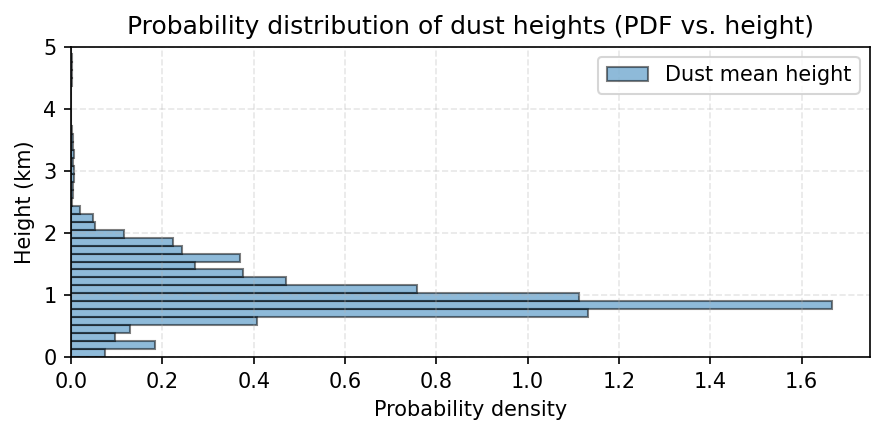

In [16]:
dust_mean = ds_dust_heights["dust_mean_height"].values
dust_mean = dust_mean[np.isfinite(dust_mean)]

bins = np.linspace(0, 5, 40)

fig, ax = plt.subplots(figsize=(6,3), dpi=150)


ax.hist(dust_mean, bins=bins, density=True, orientation="horizontal",
        alpha=0.5, label="Dust mean height", edgecolor="k")

ax.set_ylabel("Height (km)")
ax.set_xlabel("Probability density")
ax.set_ylim(0, 5)
ax.set_title("Probability distribution of dust heights (PDF vs. height)")
ax.legend()
ax.grid(alpha=0.3, ls='--')

plt.tight_layout()
plt.show()



### Cloud height / Geometric Thickness / Droplet Effective Radius (Re)

In [3]:
ds_cloud_height = xr.open_mfdataset('/data/shared_data/ARM_data/ENA/others/enaarsclkazrbnd1kolliasC1/enaarsclkazrbnd1kolliasC1.c0.201702*.nc')

In [29]:
clb_km = ds_cloud_height["cloud_layer_base_height"] / 1000.0
clt_km = ds_cloud_height["cloud_layer_top_height"]  / 1000.0

# 有效层
valid_layer = (
    np.isfinite(clb_km) & np.isfinite(clt_km) &
    (clb_km >= 0) & (clt_km >= 0)
)

# 每个时刻有效层数
n_layers = valid_layer.sum(dim="layer")

# 对所有 time 都计算唯一层索引；若不是单层云 → 设 NaN
sel_idx = valid_layer.astype(int).argmax(dim="layer")  # 先拿个索引
sel_idx = sel_idx.where(n_layers == 1)  # 非单层 → NaN

# apply_ufunc 时处理 NaN 索引
def take_by_idx(arr_1d, idx_scalar):
    if np.isnan(idx_scalar):
        return np.nan
    return arr_1d[int(idx_scalar)]

sub_clb = clb_km
sub_clt = clt_km

clb_1 = xr.apply_ufunc(
    take_by_idx,
    sub_clb,
    sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[sub_clb.dtype],
).rename("cloud_base_height")

clt_1 = xr.apply_ufunc(
    take_by_idx,
    sub_clt,
    sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True,
    dask="parallelized",
    output_dtypes=[sub_clt.dtype],
).rename("cloud_top_height")

# 派生量（km）
cloud_thickness = (clt_1 - clb_1).rename("cloud_geometric_thickness")
cloud_mean_h    = (clt_1 + clb_1) * 0.5
cloud_mean_h    = cloud_mean_h.rename("cloud_mean_height")

ds_cloud_heights = xr.Dataset(
    {
        "cloud_base_height": clb_1,
        "cloud_top_height": clt_1,
        "cloud_geometric_thickness": cloud_thickness,
        "cloud_mean_height": cloud_mean_h,
    }
)


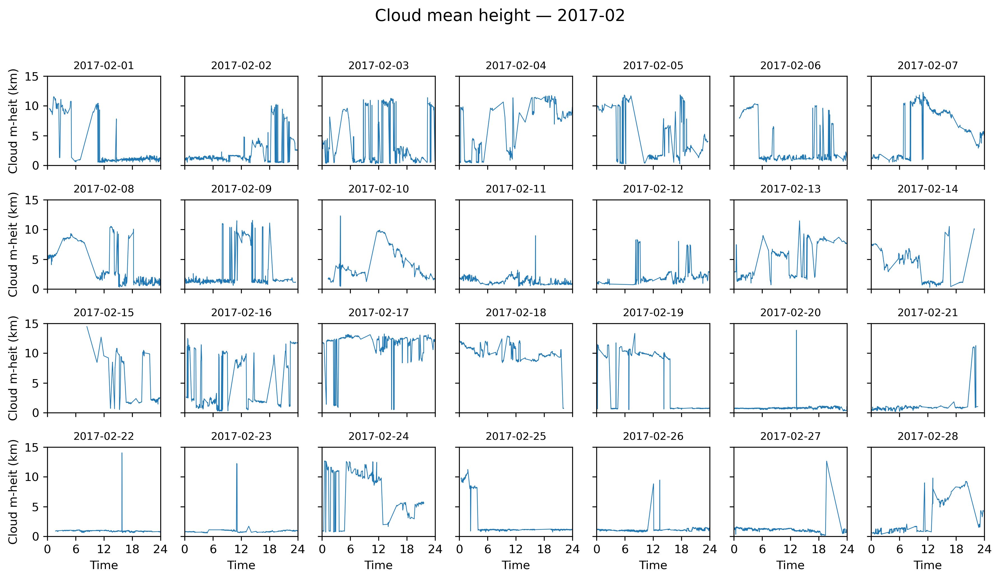

In [34]:
month = "2017-02"
days = pd.date_range(f"{month}-01", f"{month}-28", freq="D")

# 取出 cloud_mean_height（单位：km），并确保按时间排序
cmh = ds_cloud_heights["cloud_mean_height"].sortby("time")

# ====== Plot ======
fig, axes = plt.subplots(4, 7, figsize=(12, 7), sharex=True, sharey=True, dpi=300)
axes = axes.ravel()

for i, day in enumerate(days):
    ax = axes[i]

    # 当天的起止时间
    t0 = pd.Timestamp(day)
    t1 = pd.Timestamp(day) + pd.Timedelta(days=1) - pd.Timedelta(seconds=1)
    cmh_day = cmh.sel(time=slice(str(t0), str(t1)))

    # 若当日无数据，则隐藏该子图
    if cmh_day.time.size == 0:
        ax.set_visible(False)
        continue

    # 转为小时轴
    t_idx = pd.DatetimeIndex(cmh_day.time.values)
    hours = (t_idx - t_idx.normalize()).total_seconds() / 3600.0

    # 只画有效值（NaN 代表晴空/多层云被保留）
    y = cmh_day.values
    m = np.isfinite(y)
    if np.any(m):
        ax.plot(hours[m], y[m], lw=0.6)  # 颜色可按需改

    ax.set_xlim(0, 24)
    ax.set_ylim(0, 15)   # 高度范围（km），可按需改成 0–5 或其他
    ax.set_xticks([0, 6, 12, 18, 24])
    ax.set_title(day.strftime("%Y-%m-%d"), fontsize=9)

    if i % 7 == 0:
        ax.set_ylabel("Cloud m-heit (km)")
    if i // 7 == 3:
        ax.set_xlabel("Time")

fig.suptitle(f"Cloud mean height — {month}", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


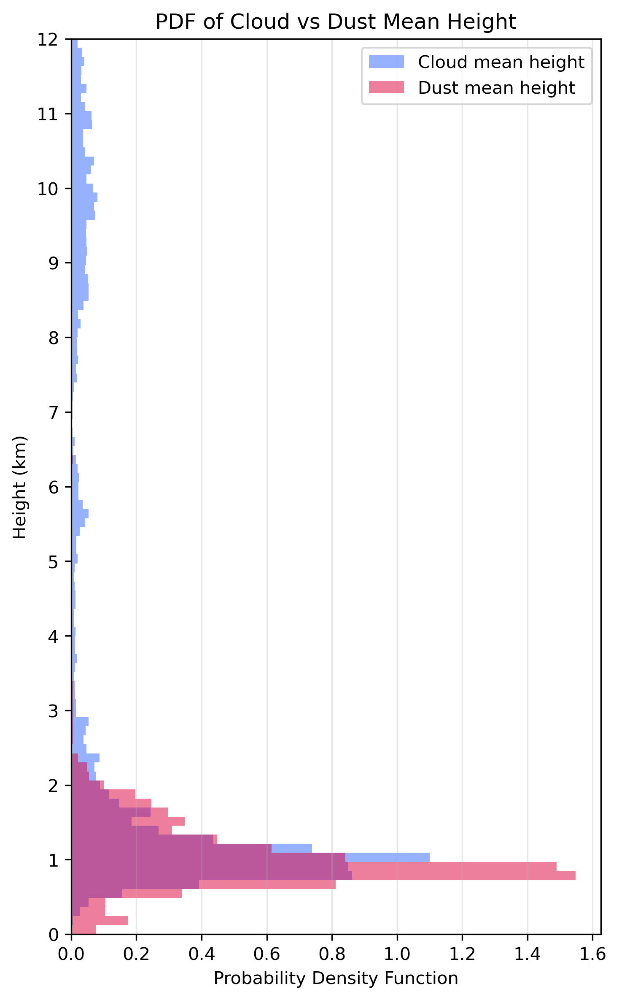

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# 提取数据，去掉 NaN
cloud_mh = ds_cloud_heights["cloud_mean_height"].values
dust_mh  = ds_dust_heights["dust_mean_height"].values

cloud_mh = cloud_mh[np.isfinite(cloud_mh)]
dust_mh  = dust_mh[np.isfinite(dust_mh)]

# 设置高度范围
ymin, ymax = 0, 12   # km
bins = np.linspace(ymin, ymax, 100)  # bin 可调，越大分辨率越细

# 计算直方图概率密度
cloud_counts, edges = np.histogram(cloud_mh, bins=bins, density=True)
dust_counts, _      = np.histogram(dust_mh,  bins=bins, density=True)

y_centers = 0.5 * (edges[:-1] + edges[1:])
bar_h     = np.diff(edges)

# ====== Plot ======
fig, ax = plt.subplots(figsize=(5, 8), dpi=300)

# 横坐标=PDF，纵坐标=高度
ax.barh(y_centers, cloud_counts, height=bar_h, alpha=0.5, label="Cloud mean height", color="#2e64fe", edgecolor=None)
ax.barh(y_centers, dust_counts,  height=bar_h, alpha=0.5, label="Dust mean height",  color="#df013a",  edgecolor=None)

ax.set_xlabel("Probability Density Function")
ax.set_ylabel("Height (km)")
ax.set_yticks(np.arange(0,13,1))
ax.set_ylim(ymin, ymax)
ax.legend()
ax.grid(axis="x", alpha=0.3)
ax.set_title("PDF of Cloud vs Dust Mean Height")

plt.tight_layout()
plt.show()


### Layer-mean Liquid Water Content (LWC): LWP divided by cloud thickness.
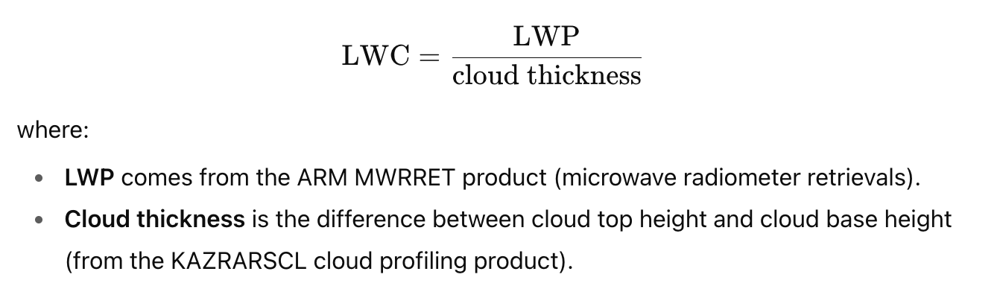



In [38]:
import numpy as np
import xarray as xr

def compute_lwc_min_bias(cloud_heights, lwp_qc, tol_seconds=60.0,
                         min_thick_km=0.0, warm_only=False, cloud_temp=None):
    """
    最小方法学偏差的层平均 LWC：最近邻+容差；无插值；对不上=NaN；单层云之外为 NaN。
    """
    cmh_time = cloud_heights["time"]
    lwp_qc = lwp_qc.sortby("time")

    tol = np.timedelta64(int(tol_seconds), "s")
    lwp_on_cloud = lwp_qc.reindex(time=cmh_time, method="nearest", tolerance=tol)

    thick_km = cloud_heights["cloud_geometric_thickness"]  # km
    if min_thick_km > 0:
        thick_km = thick_km.where(thick_km > min_thick_km)
    thick_m = thick_km * 1000.0

    if warm_only and (cloud_temp is not None):
        warm_mask = (cloud_temp >= 273.15)
        lwp_on_cloud = lwp_on_cloud.where(warm_mask)
        thick_m      = thick_m.where(warm_mask)

    valid = np.isfinite(thick_m) & (thick_m > 0) & np.isfinite(lwp_on_cloud)
    lwc = xr.where(valid, lwp_on_cloud / thick_m, np.nan).rename("layer_mean_LWC")
    lwc.attrs.update({
        "long_name": "Layer-mean liquid water content",
        "units": "g m^-3",
        "method": f"Nearest-neighbor LWP within {int(tol_seconds)} s; no interpolation; single-layer only."
    })

    out = xr.Dataset(
        data_vars={
            "cloud_base_height":         cloud_heights.get("cloud_base_height"),
            "cloud_top_height":          cloud_heights.get("cloud_top_height"),
            "cloud_geometric_thickness": thick_km,
            "cloud_mean_height":         cloud_heights.get("cloud_mean_height"),
            "layer_mean_LWC":            lwc,
        },
        coords={"time": cmh_time}
    )
    return out


def compute_re_min_bias(cloud_heights, lwp_qc, cod, tol_seconds=60.0,
                        warm_only=False, cloud_temp=None, name="effective_radius"):
    """
    最小方法学偏差的云滴有效半径 Re（Han+1995）：
      - 共定位到 cloud_heights.time（单层云之外为 NaN）
      - 最近邻 + 严格容差（默认 60s）
      - 无插值；任一变量对不上 → NaN
      - 公式（LWP[g m^-2], COD 无量纲）：Re[μm] = 1.5 * LWP / COD
    """
    cmh_time = cloud_heights["time"]
    lwp_qc = lwp_qc.sortby("time")
    cod    = cod.sortby("time")

    tol = np.timedelta64(int(tol_seconds), "s")
    lwp_on_cloud = lwp_qc.reindex(time=cmh_time, method="nearest", tolerance=tol)  # g m^-2
    cod_on_cloud = cod.reindex(time=cmh_time,    method="nearest", tolerance=tol)  # unitless

    # 可选：只保留暖云
    if warm_only and (cloud_temp is not None):
        warm_mask = (cloud_temp >= 273.15)
        lwp_on_cloud = lwp_on_cloud.where(warm_mask)
        cod_on_cloud = cod_on_cloud.where(warm_mask)

    # 仅在 LWP 与 COD 都有效，且 COD>0 时计算
    valid = np.isfinite(lwp_on_cloud) & np.isfinite(cod_on_cloud) & (cod_on_cloud > 0)

    re_um = xr.where(valid, 1.5 * (lwp_on_cloud / cod_on_cloud), np.nan)
    re_um = re_um.rename(name)
    re_um.attrs.update({
        "long_name": "Cloud droplet effective radius",
        "units": "micrometer",
        "reference": "Han et al. (1995)",
        "method": f"Re = 1.5 * LWP(g m^-2) / COD, colocated by nearest within {int(tol_seconds)} s; no interpolation; single-layer time axis."
    })

    # 打包结果（与 cloud_heights 时间完全对齐）
    out = xr.Dataset(
        data_vars={
            name:                         re_um,
            "cloud_base_height":         cloud_heights.get("cloud_base_height"),
            "cloud_top_height":          cloud_heights.get("cloud_top_height"),
            "cloud_geometric_thickness": cloud_heights.get("cloud_geometric_thickness"),
            "cloud_mean_height":         cloud_heights.get("cloud_mean_height"),
        },
        coords={"time": cmh_time}
    )
    return out


# ===== 使用示例 =====
# 你已有：
# - cloud_heights（单层云：cloud_base_height, cloud_top_height, cloud_geometric_thickness, cloud_mean_height）
# - lwp_qc：通过 QC 的 LWP (g m^-2)
# - COD：你的列光学厚度时间序列 (unitless)
# - （可选）cloud_temp：云温度 (K)

# 1) 层平均 LWC（严格 60s）
cloud_with_lwc = compute_lwc_min_bias(
    cloud_heights=ds_cloud_heights,
    lwp_qc=lwp_qc,
    tol_seconds=60.0,
    min_thick_km=0.0,     # 若要排除过薄云可改为 0.1
    warm_only=False,      # 若只做暖云，设 True 并传 cloud_temp
    cloud_temp=None
)

# 2) 有效半径 Re（严格 60s）
cloud_with_re = compute_re_min_bias(
    cloud_heights=ds_cloud_heights,
    lwp_qc=lwp_qc,
    cod=COD,              # 你的 COD DataArray
    tol_seconds=60.0,
    warm_only=False,      # 若只做暖云，设 True 并传 cloud_temp
    cloud_temp=None,
    name="effective_radius"
)


In [40]:
import numpy as np
import pandas as pd
import xarray as xr

# ---------- 工具函数（与之前相同） ----------
def keep_min_duration(mask_bool_da: xr.DataArray, min_seconds: int) -> xr.DataArray:
    t = pd.DatetimeIndex(mask_bool_da["time"].values)
    if len(t) < 2:
        return mask_bool_da & False
    step = np.median(np.diff(t).astype("timedelta64[s]").astype(float))
    step = max(1.0, float(step))
    min_len = int(np.ceil(min_seconds / step))
    arr = mask_bool_da.values.astype(bool)
    keep = np.zeros_like(arr, dtype=bool)
    run_start = None
    for i, v in enumerate(arr):
        if v and run_start is None:
            run_start = i
        if (not v or i == len(arr)-1) and run_start is not None:
            j = i if not v else i+1
            if (j - run_start) >= min_len:
                keep[run_start:j] = True
            run_start = None
    return xr.DataArray(keep, coords=mask_bool_da.coords, dims=mask_bool_da.dims)

def list_events(mask_bool_da: xr.DataArray):
    t = pd.DatetimeIndex(mask_bool_da["time"].values)
    arr = mask_bool_da.values.astype(bool)
    if arr.size == 0:
        return []
    edges = np.diff(np.r_[False, arr, False])
    starts = np.where(edges == 1)[0]
    ends   = np.where(edges == -1)[0] - 1
    events = []
    for s, e in zip(starts, ends):
        events.append(dict(
            start=t[s],
            end=t[e],
            center=t[s + (e - s)//2],
            duration_s=float((t[e] - t[s]).total_seconds())
        ))
    return events

def count_events_overlapping_window(event_list, w_start, w_end):
    cnt = 0
    for ev in event_list:
        if (ev["end"] >= w_start) and (ev["start"] <= w_end):
            cnt += 1
    return cnt

# ============================================================
# A) 厚度<3 km 掩膜（4s → 2min 对齐到 ds_a 的时间轴）
# ============================================================
if "cloud_geometric_thickness" not in ds_cloud_heights:
    raise KeyError("ds_cloud_heights 缺少 cloud_geometric_thickness 变量")

thk4s = ds_cloud_heights["cloud_geometric_thickness"]
mask_thk4s = np.isfinite(thk4s) & (thk4s > 0) & (thk4s < 3.0)

# 以最近邻（60s 容差）映射到 ds_a 的 2min 时间轴
mask_thk2m = mask_thk4s.reindex(time=ds_mon["time"], method="nearest",
                                tolerance=pd.Timedelta("60s")).fillna(False)

# ============================================================
# B) 暖云存在（基于 ds_a 的 feature cloud class + 温度）
#    —— 并与厚度<3km 掩膜取交集，再做“持续≥1h”的事件筛选
# ============================================================
# 你之前已经有：T_K_WARM = 273.15, cloud_class = 21
warm_cloud_time = ((feature_mask == cloud_class) & (temp_qc >= T_K_WARM)).any(dim="height_high")

# 同时满足“暖云存在”与“厚度<3km”
warm_thin_cloud_time = (warm_cloud_time & mask_thk2m).rename("warm_thin_cloud_time")

# 持续时间 ≥ 1h（在 2min 轴上连通段）
warm_thin_cloud_long = keep_min_duration(warm_thin_cloud_time, min_seconds=3600)

# 事件清单
cloud_events = list_events(warm_thin_cloud_long)

# ============================================================
# C) 配对窗：把气溶胶时间限制在离“暖云(≥1h, 厚度<3km)”的 5–60 分钟
# ============================================================
t_all = ds_mon["time"].values
if warm_thin_cloud_long.any():
    t_cloud = ds_mon["time"].values[warm_thin_cloud_long.values]
    idx      = np.searchsorted(t_cloud, t_all)
    idx_prev = np.clip(idx - 1, 0, t_cloud.size - 1)
    idx_next = np.clip(idx,       0, t_cloud.size - 1)
    dt_prev  = np.abs(t_all - t_cloud[idx_prev])
    dt_next  = np.abs(t_all - t_cloud[idx_next])
    min_dt   = np.minimum(dt_prev, dt_next)

    time_in_pair_window = xr.DataArray(
        (min_dt >= np.timedelta64(5, 'm')) & (min_dt <= np.timedelta64(60, 'm')),
        coords={"time": ds_mon["time"]}, dims=["time"],
        name="time_in_pair_window"
    )
else:
    time_in_pair_window = xr.DataArray(
        np.zeros(ds_mon.sizes["time"], dtype=bool),
        coords={"time": ds_mon["time"]}, dims=["time"],
        name="time_in_pair_window"
    )

# 用配对窗更新气溶胶样本
feature_mask_pair = feature_mask.where(time_in_pair_window)
aerosol_mask      = (feature_mask_pair == aerosol_class)
ext_aerosol       = ext.where(aerosol_mask)     # 用于 AOD / 剖面几何量
ext_dust_pair     = ext_dust.where(aerosol_mask) if "ext_dust" in locals() else None

# ============================================================
# D) 统计：云事件总数 & 每个云事件前/后的 dust 事件数
# ============================================================
# 定义 dust 事件（2min 轴上，任意高度 ext_dust>0 的连通段）
rows = []
dust_events = []
if ext_dust_pair is not None:
    dust_present = (ext_dust_pair > 0).any(dim="height_high").fillna(False)
    dust_events = list_events(dust_present)

for i, cev in enumerate(cloud_events, 1):
    c = cev["center"]
    pre_start,  pre_end  = c - pd.Timedelta(minutes=60), c - pd.Timedelta(minutes=5)
    post_start, post_end = c + pd.Timedelta(minutes=5), c + pd.Timedelta(minutes=60)
    n_pre  = count_events_overlapping_window(dust_events,  pre_start,  pre_end)  if dust_events else 0
    n_post = count_events_overlapping_window(dust_events, post_start, post_end) if dust_events else 0
    rows.append(dict(
        cloud_event_id=i,
        cloud_start=cev["start"], cloud_end=cev["end"], cloud_center=c,
        cloud_duration_s=cev["duration_s"],
        n_dust_events_before=n_pre,
        n_dust_events_after=n_post
    ))

import pandas as pd
cloud_dust_stats = pd.DataFrame(rows)

print(f"[汇总] 暖云(≥1h, 厚度<3km) 事件数: {len(cloud_events)}")
if len(rows):
    print(f"[汇总] 云前 dust 事件总数（-60~-5 分钟）: {int(cloud_dust_stats['n_dust_events_before'].sum())}")
    print(f"[汇总] 云后 dust 事件总数（+5~+60 分钟）: {int(cloud_dust_stats['n_dust_events_after'].sum())}")
else:
    print("[汇总] 未找到满足条件的云事件；dust 事件统计为空。")


[汇总] 暖云(≥1h, 厚度<3km) 事件数: 0
[汇总] 未找到满足条件的云事件；dust 事件统计为空。
